**Brian Blaylock**  
**September 26, 2019**

# `rgb.py` Demo

I have gathered several RGB recipies from the [RAMMB CIRA](http://rammb.cira.colostate.edu/training/visit/quick_guides/) website, including:

- TrueColor
- FireTemperature
- AirMass
- DayCloudPhase
- DayConvection
- DayLandCloudFire
- WaterVapor
- DaySnowFog
- etc.

These recipies are in the `make_RGB.py` file in this directory.

For more details on how to generate these plots, see the example on the [Unidata gallery](http://unidata.github.io/python-gallery/examples/mapping_GOES16_TrueColor.html#sphx-glr-examples-mapping-goes16-truecolor-py).

In [5]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from datetime import datetime
import pandas as pd

from goes2go.rgb import *
from goes2go.data import goes_latest, goes_nearesttime
from goes2go.tools import abi_crs

from toolbox.cartopy_tools import common_features

In [7]:
DATE = datetime(2020, 9, 22, 18)
G16 = goes_nearesttime(attime=DATE, satellite=16, product='ABI')
G17 = goes_nearesttime(attime=DATE, satellite=17, product='ABI')

 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPC    |
 |    Domain: C                |
📦 Finished downloading [1] files to [/p/home/blaylock/data/noaa-goes16/ABI-L2-MCMIPC].                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [8]:
# Get projection object and sweeps
#crs16, x16, y16 = abi_crs(G16)
#crs17, x17, y17 = abi_crs(G17)

In [9]:
G16[list(G16)[0]]

<xarray.DataArray 'CMI_C01' (y: 1500, x: 2500)>
[3750000 values with dtype=float32]
Coordinates:
    t                    datetime64[ns] ...
  * y                    (y) float32 0.1282 0.1282 0.1281 ... 0.04432 0.04427
  * x                    (x) float32 -0.1013 -0.1013 -0.1012 ... 0.03856 0.03861
    y_image              float32 ...
    x_image              float32 ...
    dataset_name         <U74 'OR_ABI-L2-MCMIPC-M6_G16_s20202661801132_e20202...
    date_created         <U22 '2020-09-22T18:04:06.0Z'
    time_coverage_start  <U22 '2020-09-22T18:01:13.2Z'
    time_coverage_end    <U22 '2020-09-22T18:03:50.5Z'
Attributes:
    long_name:              ABI Cloud and Moisture Imagery reflectance factor
    standard_name:          toa_lambertian_equivalent_albedo_multiplied_by_co...
    sensor_band_bit_depth:  10
    downsampling_method:    average
    valid_range:            [   0 4095]
    units:                  1
    resolution:             y: 0.000056 rad x: 0.000056 rad
    grid_mapping:           goes_imager_projection
    cell_methods:           t: point area: sum (interval: 0.000028 rad)
    ancillary_variables:    DQF_C01

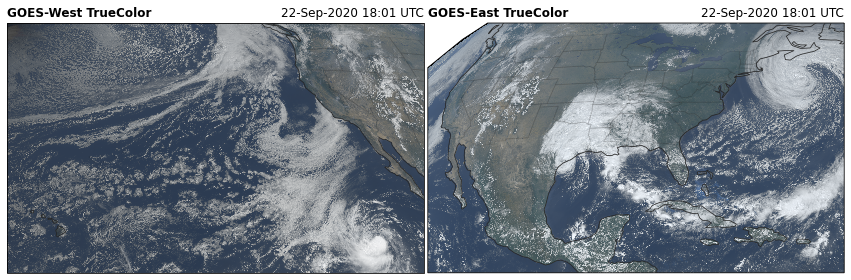

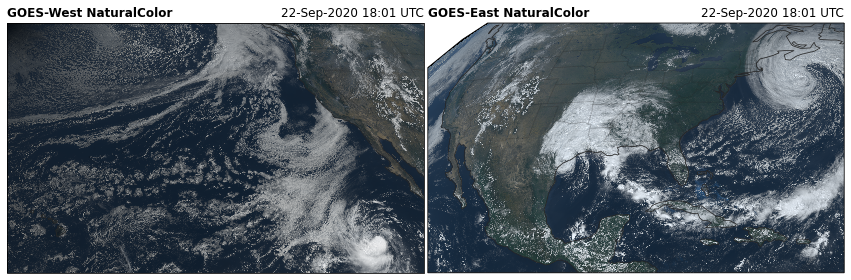

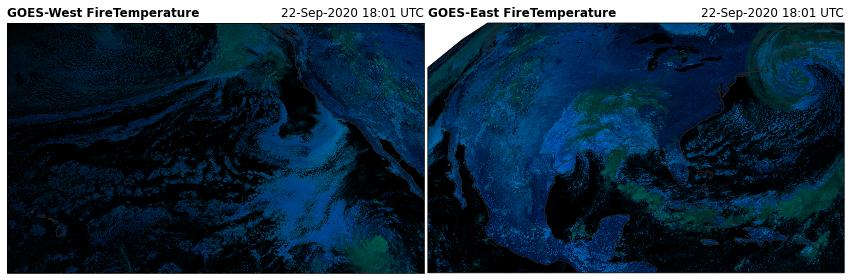

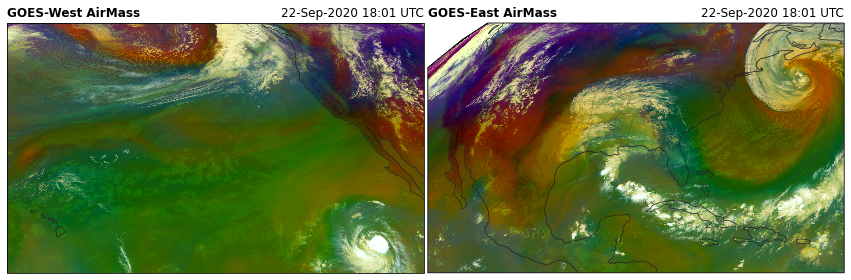

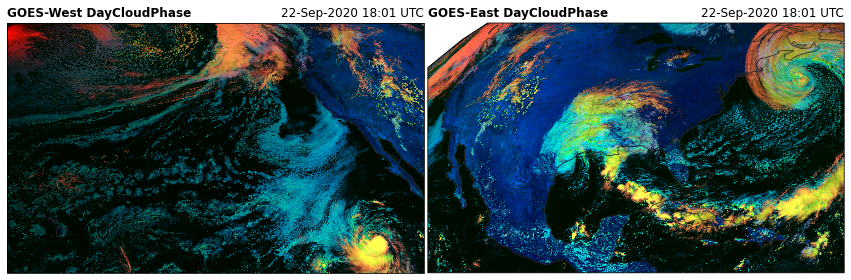

...

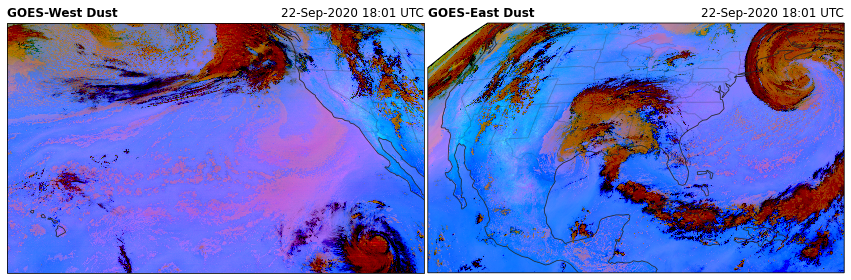

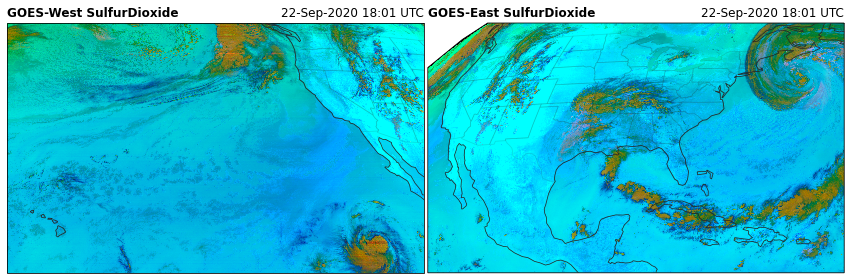

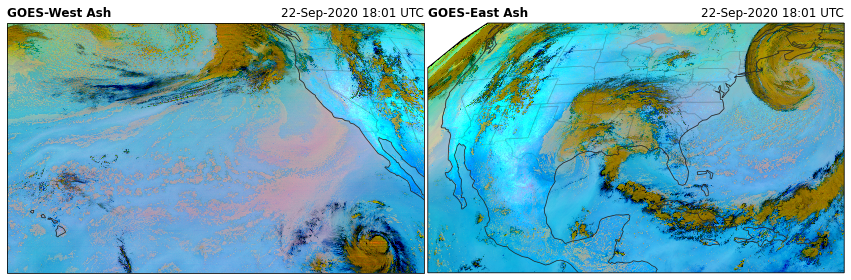

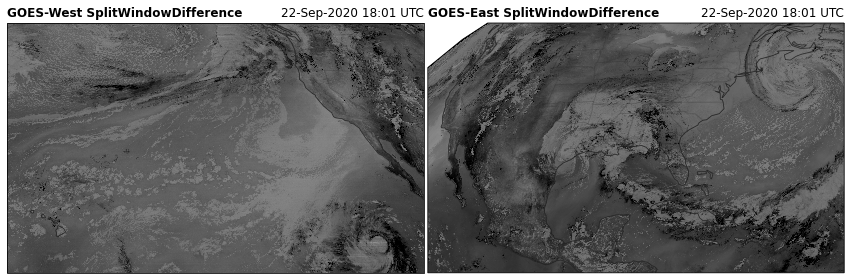

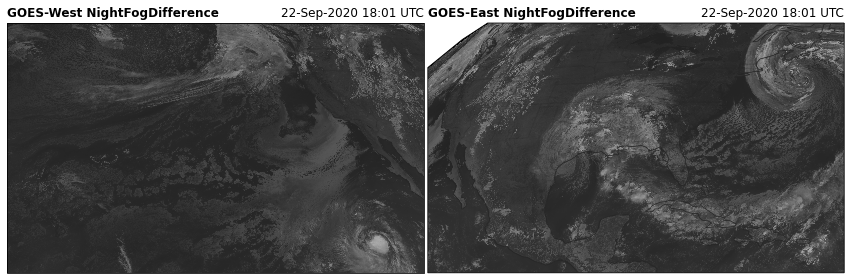

In [11]:
functions = [TrueColor, NaturalColor, FireTemperature, AirMass, \
             DayCloudPhase, DayConvection, DayCloudConvection,\
             DayLandCloud, DayLandCloudFire, \
             WaterVapor, DifferentialWaterVapor, \
             DaySnowFog, NighttimeMicrophysics, \
             Dust, SulfurDioxide, Ash, \
             SplitWindowDifference, NightFogDifference]

str_date_16 = f"{pd.to_datetime(G16.time_coverage_start.item()):%d-%b-%Y %H:%M UTC}"
str_date_17 = f"{pd.to_datetime(G16.time_coverage_start.item()):%d-%b-%Y %H:%M UTC}"

for i, func in enumerate(functions):
    fig = plt.figure(figsize=(15, 12))

    RGB17 = func(G17)
    RGB16 = func(G16)
    
    # Create axis with Geostationary projection
    ax17 = fig.add_subplot(1, 2, 1, projection=RGB17.crs)
    ax16 = fig.add_subplot(1, 2, 2, projection=RGB16.crs)

    # Add common features to map (coastlines and state borders)
    common_features(ax=ax16, STATES=True)
    common_features(ax=ax17, STATES=True)
    
    # GOES-West
    ax17.set_title(f'GOES-West {func.__name__}', loc='left', fontweight='bold')
    ax17.set_title(f'{str_date_17}', loc='right')
    ax17.imshow(RGB17[list(RGB17)[0]], **RGB17.imshow_kwargs)
    
    # GOES-East
    ax16.set_title(f'GOES-East {func.__name__}', loc='left', fontweight='bold')
    ax16.set_title(f'{str_date_16}', loc='right')
    ax16.imshow(RGB16[list(RGB16)[0]], **RGB16.imshow_kwargs)
    
    plt.subplots_adjust(wspace=0.01)
    #plt.savefig(f'../images/{func.__name__}', bbox_inches='tight')
    plt.savefig(f'../docs/_static/{func.__name__}', bbox_inches='tight')

## Full Disk

In [2]:
g = goes_nearesttime('2021-01-01 18:00', satellite=16, product='ABI', domain='F')

 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPF    |
 |    Domain: F                |
📦 Finished downloading [1] files to [/p/home/blaylock/data/noaa-goes16/ABI-L2-MCMIPF].                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [3]:
# Original TrueColor
tc = TrueColor(g, night_IR=False)

# Rick Kohrs's Natural Color
nc = NaturalColor(g, night_IR=False)

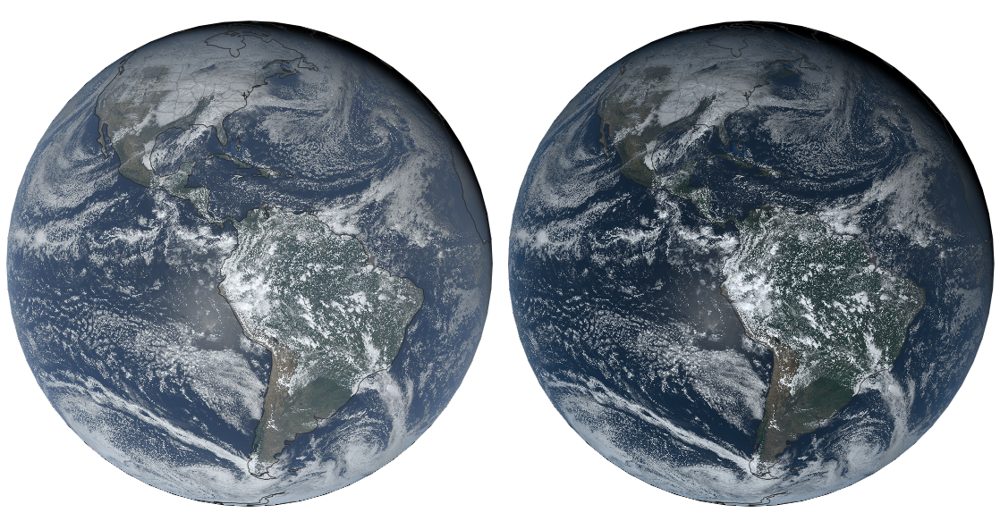

In [25]:
#%config InlineBackend.print_figure_kwargs = {'facecolor' : 'k'}
%config InlineBackend.print_figure_kwargs = {'facecolor' : 'none'}
#%config InlineBackend.print_figure_kwargs = {'facecolor' : 'w'}

fig, (ax1, ax2) = plt.subplots(1,2, figsize=[20,10], subplot_kw=dict(projection=tc.crs))

for ax in [ax1, ax2]:
    common_features(ax=ax, STATES=True)


ax1.imshow(tc.TrueColor, **tc.imshow_kwargs)
ax1.set_title('True Color', color='w')
ax1.axis('off')

ax2.imshow(nc.NaturalColor, **nc.imshow_kwargs)
ax2.set_title('Natural Color', color='w')
ax2.axis('off')

plt.subplots_adjust(wspace=0.01)
fig.set_facecolor('k')

In [ ]:
#%config InlineBackend.print_figure_kwargs = {'facecolor' : 'k'}
#%config InlineBackend.print_figure_kwargs = {'facecolor' : 'none'}
%config InlineBackend.print_figure_kwargs = {'facecolor' : 'w'}

## RGB Sample

In [3]:
# Obtain a GOES ABI multichannel image
g = goes_nearesttime('2020-12-13 18:00',
                     satellite=16, product='ABI', domain='F')

 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPF    |
 |    Domain: F                |
📦 Finished downloading [1] files to [/p/home/blaylock/data/noaa-goes16/ABI-L2-MCMIPF].                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

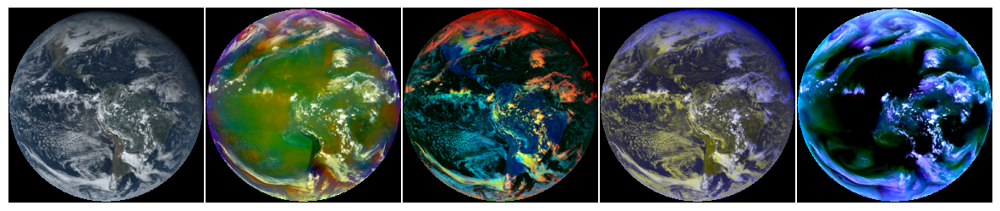

In [10]:
functions = [NaturalColor, AirMass, \
             DayCloudPhase, DayCloudConvection,
             WaterVapor]

fig, axes = plt.subplots(1,len(functions), figsize=[15,3.5], dpi=100)
for func, ax in zip(functions, axes):
    nc = func(g.thin(5))
    ax.imshow(nc[func.__name__])
    ax.axis('off')
plt.subplots_adjust(wspace=.01)

plt.savefig(f'../docs/_static/RGB_sample', bbox_inches='tight', facecolor='k')

# 🚀 Rocket Plume
A new RGB recipie from [CIMSS](https://cimss.ssec.wisc.edu/satellite-blog/archives/41335)

In [1]:
import matplotlib.pyplot as plt
import pandas as pd

from goes2go.data import goes_nearesttime
from goes2go.rgb import RocketPlume

from toolbox.cartopy_tools import common_features

In [2]:
# Rocket plume at 00:29 UTC 16 November 2020 for SpaceX crewed mission
g = goes_nearesttime('2020-11-16 00:29:50', product="ABI", satellite='goes16', domain='M')

 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPM    |
 |    Domain: M                |
📦 Finished downloading [1] files to [/p/home/blaylock/data/noaa-goes16/ABI-L2-MCMIPM].                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [3]:
g.filename

<xarray.DataArray 'filename' ()>
array('noaa-goes16/ABI-L2-MCMIPM/2020/321/00/OR_ABI-L2-MCMIPM2-M6_G16_s20203210029500_e20203210029559_c20203210030044.nc',
      dtype='<U113')
Coordinates:
    t                    datetime64[ns] ...
    y_image              float32 ...
    x_image              float32 ...
    dataset_name         <U75 'OR_ABI-L2-MCMIPM2-M6_G16_s20203210029500_e2020...
    date_created         <U22 '2020-11-16T00:30:04.4Z'
    time_coverage_start  <U22 '2020-11-16T00:29:50.0Z'
    time_coverage_end    <U22 '2020-11-16T00:29:55.9Z'

In [4]:
RGB = RocketPlume(g)

/p/home/blaylock/anaconda3/envs/basic38/lib/python3.8/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


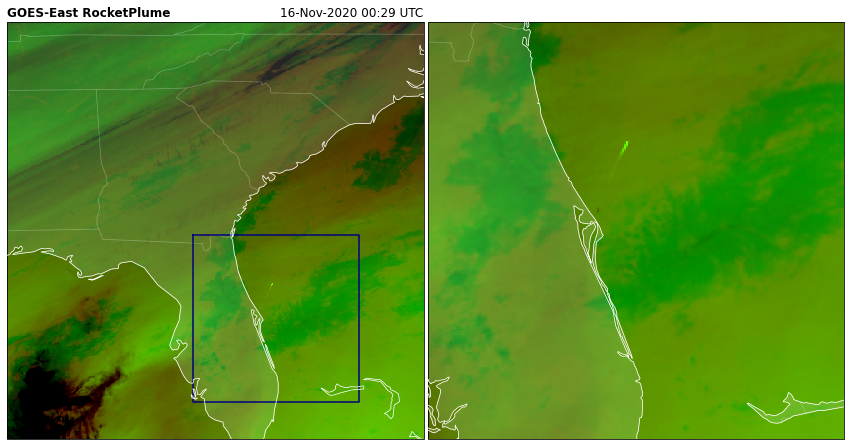

In [5]:
fig = plt.figure(figsize=(15, 12))

str_date_16 = f"{pd.to_datetime(g.time_coverage_start.item()):%d-%b-%Y %H:%M UTC}"

# Create axis with Geostationary projection
ax16_wide = fig.add_subplot(1, 2, 1, projection=RGB.crs)
ax16_zoom = fig.add_subplot(1, 2, 2, projection=RGB.crs)

# Add common features to map (coastlines and state borders)
common_features('50m', ax=ax16_wide, STATES=True, color='white')
common_features('10m', ax=ax16_zoom, STATES=True, color='white')

# GOES-East
ax16_wide.set_title(f'GOES-East RocketPlume', loc='left', fontweight='bold')
ax16_wide.set_title(f'{str_date_16}', loc='right')
ax16_wide.imshow(RGB[list(RGB)[0]], **RGB.imshow_kwargs)

ax16_zoom.imshow(RGB[list(RGB)[0]], **RGB.imshow_kwargs)
ax16_zoom.center_extent(-80.2, 28.52, pad=20_0000)


left, right, bottom, top = ax16_zoom.get_extent()

lons = [left, right, right, left, left]
lats = [top, top, bottom, bottom, top]

ax16_wide.plot(lons, lats, color='navy')


plt.subplots_adjust(wspace=0.01)
#plt.savefig(f'../images/{func.__name__}', bbox_inches='tight')
plt.savefig(f'../docs/_static/RocketPlume', bbox_inches='tight')

In [3]:
from goes2go.data import _goes_file_df, _check_param_inputs

In [4]:
_check_param_inputs(satellite='16', product='ABI', domain='M')

 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPM    |
 |    Domain: M                |


('noaa-goes16', 'ABI-L2-MCMIPM', 'M')

In [54]:
attime = pd.to_datetime('2020-11-16 00:29')
start = attime - pd.to_timedelta('1H')
end = attime + pd.to_timedelta('1H')
df = _goes_file_df('noaa-goes16', 'ABI-L2-MCMIPM', start, end)


domain = 'M2'
if domain.upper() in ['M1', 'M2']:
    df = df[df['file'].str.contains(f"{domain.upper()}-M")]

#df = df.sort_values('start')
#nearest_time_index = df.set_index(df.start).index.get_loc(attime, method='nearest')
#df = df.loc[df.index == nearest_time_index]
#df

In [55]:
df = df.sort_values('start').set_index(df.start)
nearest_time_index = df.index.get_loc(attime, method='nearest')
nearest_time_index
df = df.iloc[[nearest_time_index]]
df = df.reset_index(drop=True)
#df
df

,file,start,end,creation
0,noaa-goes16/ABI-L2-MCMIPM/2020/321/00/OR_ABI-L...,2020-11-16 00:28:50,2020-11-16 00:28:56.300,2020-11-16 00:29:04.600


In [35]:
df.index == 

DatetimeIndex(['2020-11-15 23:29:50', '2020-11-15 23:30:50',
               '2020-11-15 23:31:50', '2020-11-15 23:32:50',
               '2020-11-15 23:33:50', '2020-11-15 23:34:50',
               '2020-11-15 23:35:50', '2020-11-15 23:36:50',
               '2020-11-15 23:37:50', '2020-11-15 23:38:50',
               ...
               '2020-11-16 01:19:50', '2020-11-16 01:20:50',
               '2020-11-16 01:21:50', '2020-11-16 01:22:50',
               '2020-11-16 01:23:50', '2020-11-16 01:24:50',
               '2020-11-16 01:25:50', '2020-11-16 01:26:50',
               '2020-11-16 01:27:50', '2020-11-16 01:28:50'],
              dtype='datetime64[ns]', name='start', length=119, freq=None)

In [24]:
df.iloc[nearest_time_index]

file        noaa-goes16/ABI-L2-MCMIPM/2020/321/00/OR_ABI-L...
start                                     2020-11-16 00:28:50
end                                2020-11-16 00:28:56.300000
creation                           2020-11-16 00:29:04.600000
Name: 148, dtype: object

In [136]:
df = df.sort_values('start')
df.set_index(df.start).index.get_loc(attime, method='nearest')

117

In [164]:
df

,file,start,end,creation
0,noaa-goes16/ABI-L2-MCMIPM/2020/320/23/OR_ABI-L...,2020-11-15 23:29:20.000,2020-11-15 23:29:27.000,2020-11-15 23:29:34.000
30,noaa-goes16/ABI-L2-MCMIPM/2020/320/23/OR_ABI-L...,2020-11-15 23:29:50.000,2020-11-15 23:29:57.200,2020-11-15 23:30:04.400
1,noaa-goes16/ABI-L2-MCMIPM/2020/320/23/OR_ABI-L...,2020-11-15 23:30:22.900,2020-11-15 23:30:28.600,2020-11-15 23:30:38.300
31,noaa-goes16/ABI-L2-MCMIPM/2020/320/23/OR_ABI-L...,2020-11-15 23:30:50.000,2020-11-15 23:30:55.800,2020-11-15 23:31:03.500
2,noaa-goes16/ABI-L2-MCMIPM/2020/320/23/OR_ABI-L...,2020-11-15 23:31:20.000,2020-11-15 23:31:26.400,2020-11-15 23:31:33.900
...,...,...,...,...
235,noaa-goes16/ABI-L2-MCMIPM/2020/321/01/OR_ABI-L...,2020-11-16 01:26:50.000,2020-11-16 01:26:56.900,2020-11-16 01:27:05.200
207,noaa-goes16/ABI-L2-MCMIPM/2020/321/01/OR_ABI-L...,2020-11-16 01:27:20.000,2020-11-16 01:27:26.900,2020-11-16 01:27:34.100
236,noaa-goes16/ABI-L2-MCMIPM/2020/321/01/OR_ABI-L...,2020-11-16 01:27:50.000,2020-11-16 01:27:56.900,2020-11-16 01:28:04.400
208,noaa-goes16/ABI-L2-MCMIPM/2020/321/01/OR_ABI-L...,2020-11-16 01:28:20.000,2020-11-16 01:28:26.300,2020-11-16 01:28:35.100


In [180]:
df[df['file'].str.contains("M1-")].file.iloc[0]

'noaa-goes16/ABI-L2-MCMIPM/2020/320/23/OR_ABI-L2-MCMIPM1-M6_G16_s20203202329200_e20203202329270_c20203202329340.nc'

In [117]:
# Rocket plume at 00:29 UTC 16 November 2020 for SpaceX crewed mission
g = goes_nearesttime('2020-11-16 00:29:50', product="ABI", satellite='goes16', domain='M', within='3S')

 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPM    |
 |    Domain: M                |


KeyError: Timestamp('2020-11-16 00:29:50')